# NumPyを使った画像データ処理

## 画像とNumPy配列の間の変換

### 画像をNumPy配列に変換
※ここで読み込んでいる画像はUSCデータベース [https://sipi.usc.edu/database/database.php](https://sipi.usc.edu/database/database.php) からダウンロードできます。

In [1]:
from PIL import Image
import numpy as np

im = Image.open("data/4.2.07.tiff")
print(im.format)
print(im.size)
print(im.mode)

TIFF
(512, 512)
RGB


In [2]:
im_array = np.array(im)
print(type(im_array))

<class 'numpy.ndarray'>


In [3]:
print(im_array.shape)

(512, 512, 3)


In [4]:
print(im_array[0, 0, :])

[101   0   0]


In [5]:
print(im_array[256, :, :])

[[131   0   0]
 [188  60  51]
 [189  76  56]
 ...
 [204  48  46]
 [192  38  36]
 [205  46  44]]


In [6]:
print(im_array[256, 128, :])

[176 192  80]


### NumPy配列を画像に変換

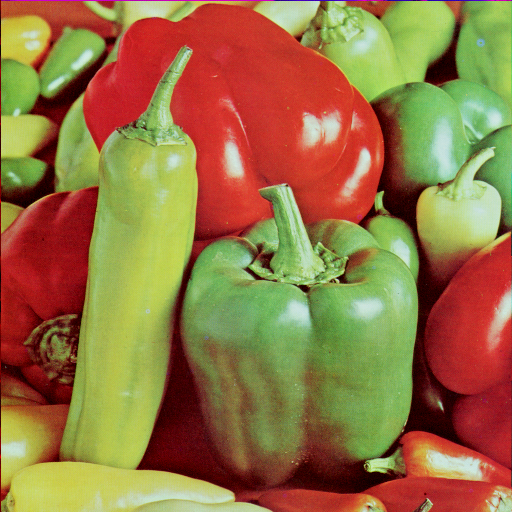

In [7]:
Image.fromarray(im_array)

## 拡大／縮小

In [8]:
import cv2 as cv

# 幅128ピクセル、高さ256ピクセルに変換
im_resized1 = cv.resize(im_array, (128, 256))
Image.fromarray(im_resized1)

ModuleNotFoundError: No module named 'cv2'

In [9]:
# 横方向に0.25倍、縦方向に0.5倍
im_resized2 = cv.resize(im_array, dsize=None, fx=0.25, fy=0.5)
Image.fromarray(im_resized2)

NameError: name 'cv' is not defined

In [10]:
im_resized3 = cv.resize(
    im_array,
    (128, 256),
    interpolation=cv.INTER_AREA,
)
Image.fromarray(im_resized3)

NameError: name 'cv' is not defined

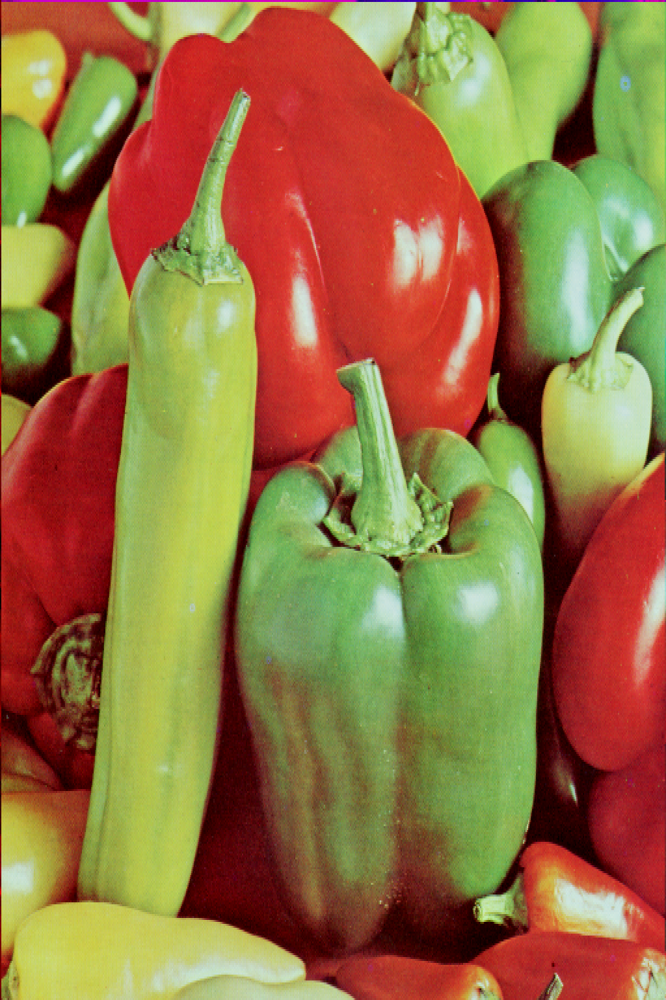

In [11]:
# 縦に3倍、横に2倍
im_repeated = im_array.repeat(3, axis=0).repeat(2, axis=1)
Image.fromarray(im_repeated)

## 切り取り／貼り付け

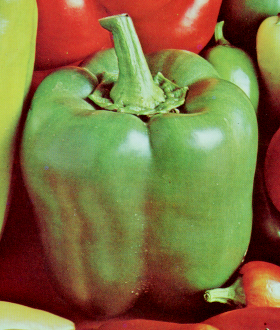

In [12]:
# 中央右のピーマンを縦330、横280の長方形に切り取る
im_cropped = im_array[170:500, 160:440, :]
Image.fromarray(im_cropped)

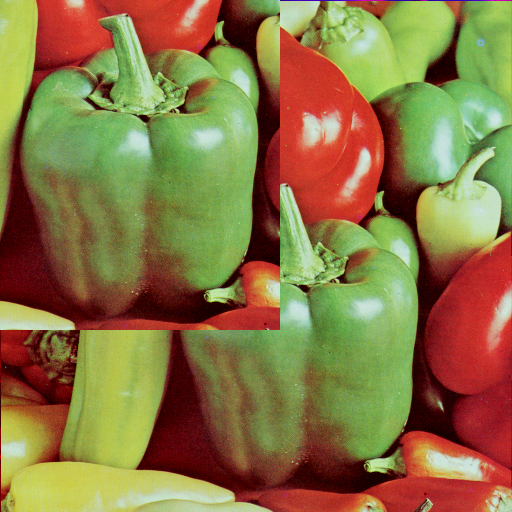

In [13]:
# 左上隅に貼り付け
im_pasted = im_array.copy()
im_pasted[0:330, 0:280, :] = im_cropped
Image.fromarray(im_pasted)

## 分割（n等分）

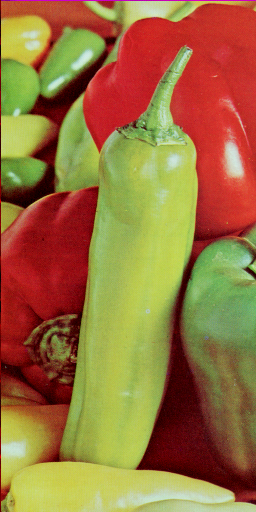

In [14]:
# 左右に2等分
im_left, im_right = np.split(im_array, 2, axis=1)
Image.fromarray(im_left)  # 左

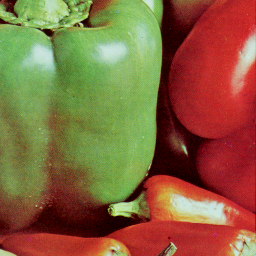

In [15]:
# 上下左右に2等分（4分割）
im_split_list = []
for part in np.split(im_array, 2, axis=0):
    im_split_list.extend(np.split(part, 2, axis=1))

Image.fromarray(im_split_list[3])  # 右下

## 90度単位での回転

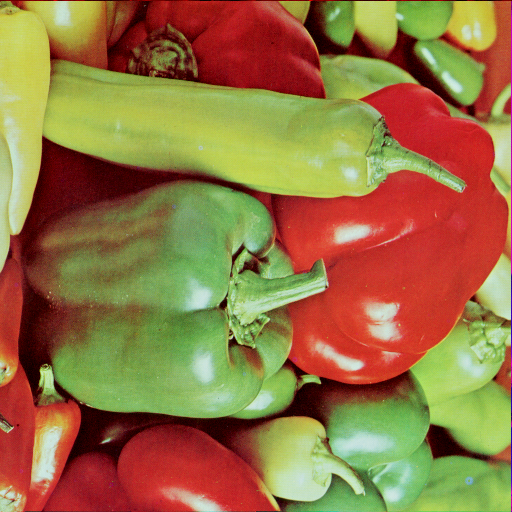

In [16]:
# 反時計回りに270°回転
im_rotated270 = np.rot90(im_array, k=3)  # k=-1でも同じ
Image.fromarray(im_rotated270)

## 反転

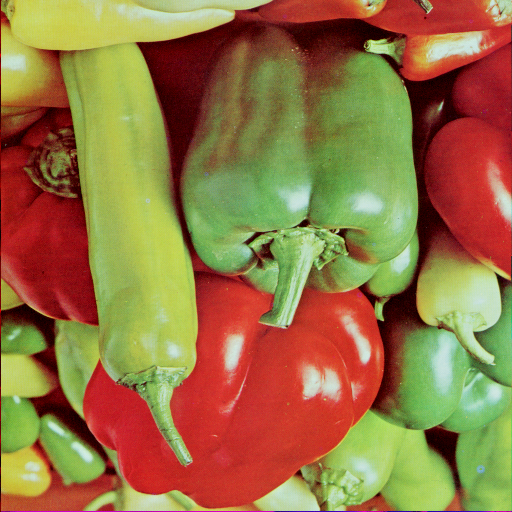

In [17]:
# 上下反転
im_flipped_vertical = np.flip(im_array, axis=0)
Image.fromarray(im_flipped_vertical)

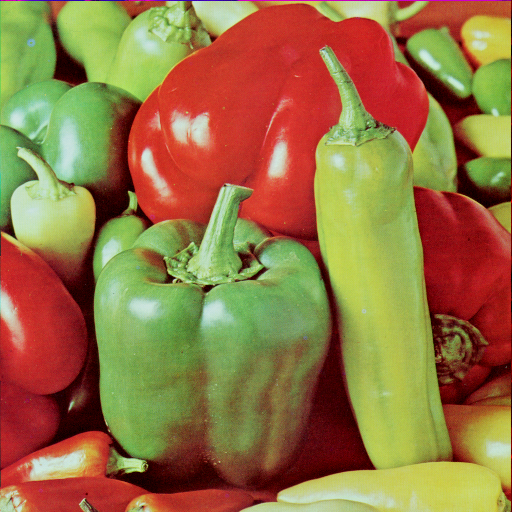

In [18]:
# 左右反転
im_flipped_horizontal = np.flip(im_array, axis=1)
Image.fromarray(im_flipped_horizontal)

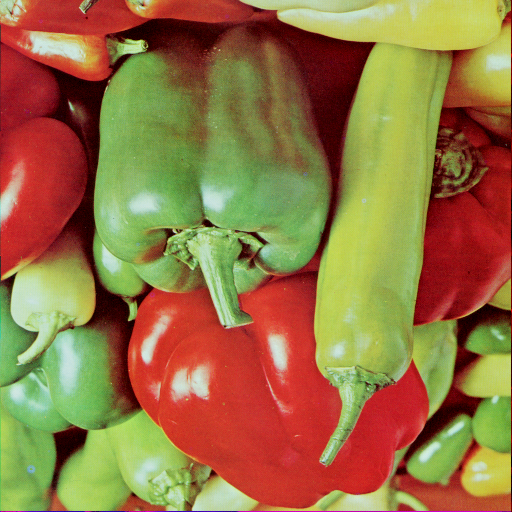

In [19]:
# 上下左右反転（180°回転と同じ）
im_flipped_both = np.flip(im_array, axis=(0, 1))
Image.fromarray(im_flipped_both)

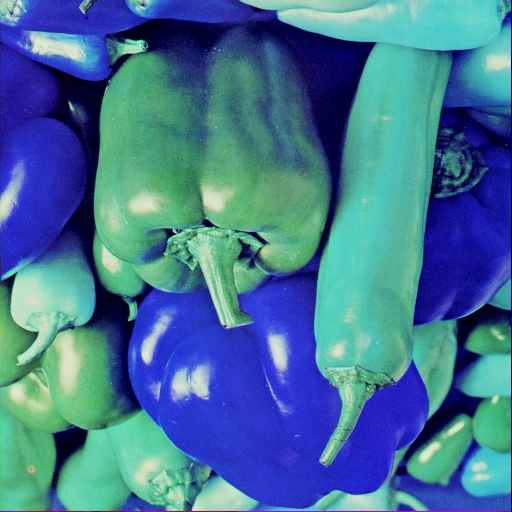

In [20]:
# 反転方向の指定なし
im_flipped_wrong = np.flip(im_array)
Image.fromarray(im_flipped_wrong)

## 複製／貼り合わせ

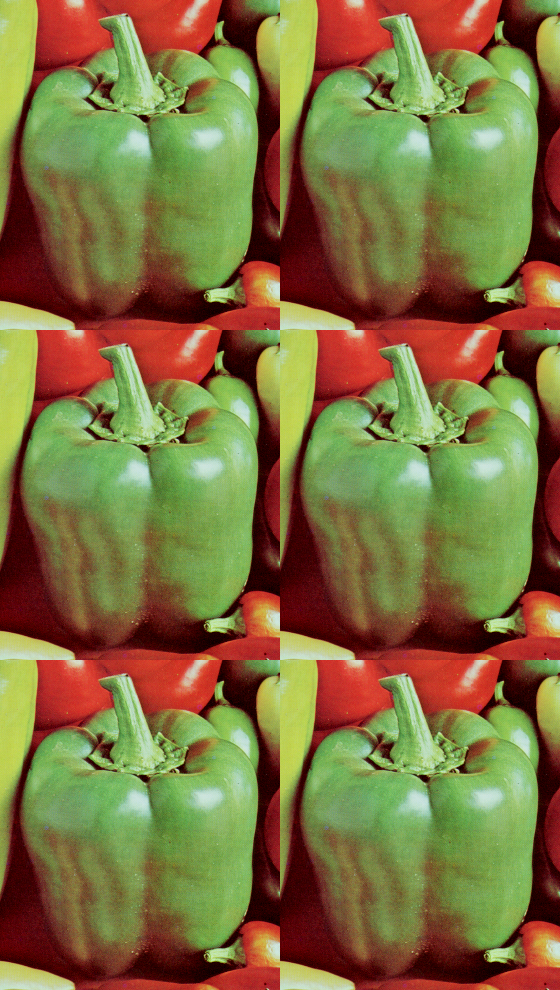

In [21]:
# 縦方向に3回、横方向に2回複製。
im_tiled = np.tile(im_cropped, reps=(3, 2, 1))
Image.fromarray(im_tiled)

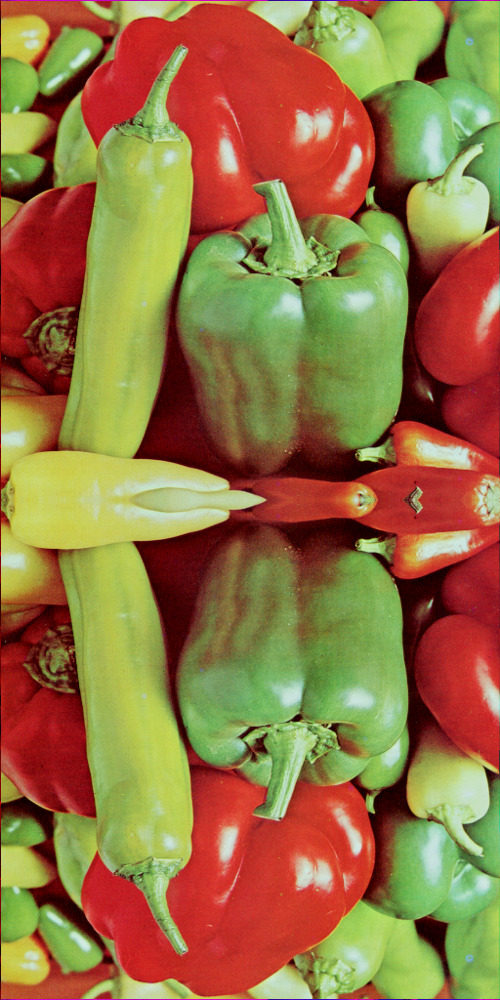

In [22]:
# 縦方向に並べる
im_concatenated_vertical = np.concatenate(
    [im_array, im_flipped_vertical],
    axis=0,
)
Image.fromarray(im_concatenated_vertical)

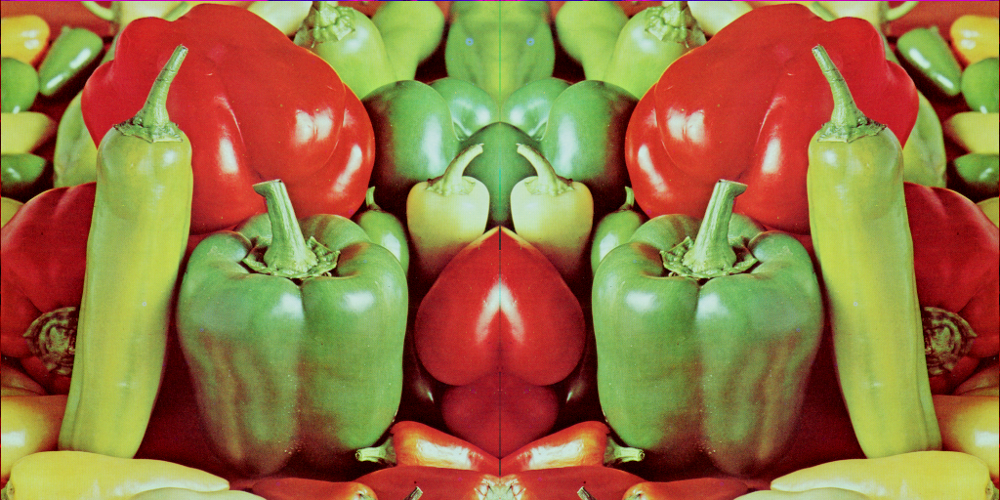

In [23]:
# 横方向に並べる
im_concatenated_horizontal = np.concatenate(
    [im_array, im_flipped_horizontal],
    axis=1,
)
Image.fromarray(im_concatenated_horizontal)

## 次元の操作

### ravel()

In [24]:
im_2d = im_array[:, :, 0]  # Rチャネルを抽出
print(f"{im_2d.shape=}")
print(f"{np.ravel(im_2d).shape=}")  # 要素の数は512x512
print(np.array_equal(np.ravel(im_2d), im_2d.flatten()))  # 同じ結果であることを確認

im_2d.shape=(512, 512)
np.ravel(im_2d).shape=(262144,)
True


In [25]:
im_order = im_2d[0:2, 0:2]  # 配列の左隅の2行2列
print(im_order)
print(f'行を優先： {np.ravel(im_order, order="C")}')  # C言語形式、デフォルト
print(f'列を優先： {np.ravel(im_order, order="F")}')  # FORTRAN言語形式

[[101 140]
 [123 191]]
行を優先： [101 140 123 191]
列を優先： [101 123 140 191]


### expand_dims()

In [26]:
im_3d_last = np.expand_dims(im_2d, axis=-1)  # 最後に追加
im_3d_first = np.expand_dims(im_2d, axis=0)  # 先頭に追加
im_3d_1 = np.expand_dims(im_2d, axis=1)  # 1番目に追加

print(f"{im_3d_last.shape=}")
print(f"{im_3d_first.shape=}")
print(f"{im_3d_1.shape=}")

im_3d_last.shape=(512, 512, 1)
im_3d_first.shape=(1, 512, 512)
im_3d_1.shape=(512, 1, 512)


### squeeze()

In [27]:
im_2d_squeezed_last = np.squeeze(im_3d_last, axis=-1)
im_2d_squeezed_1 = np.squeeze(im_3d_1, axis=1)

print(f"{im_2d_squeezed_last.shape=}")
print(f"{im_2d_squeezed_1.shape=}")

# 同じ結果であることを確認
print(
    np.array_equal(
        im_2d_squeezed_last,
        im_2d_squeezed_1,
    )
)

im_2d_squeezed_last.shape=(512, 512)
im_2d_squeezed_1.shape=(512, 512)
True


## HWCとCHWとの変換

### HWCからCHWへ

In [28]:
im_hwc = im_cropped.copy()  # 切り取ったピーマン
print(im_hwc.shape)

(330, 280, 3)


In [29]:
print(np.swapaxes(im_hwc, 1, 2).swapaxes(0, 1).shape)

(3, 330, 280)


In [30]:
print(np.moveaxis(im_hwc, 2, 0).shape)

(3, 330, 280)


In [31]:
print(np.transpose(im_hwc, (2, 0, 1)).shape)

(3, 330, 280)


### CHWからHWCへ

In [32]:
# 準備（CHWに変換しておく。）
im_chw = np.transpose(im_hwc, (2, 0, 1))
print(im_chw.shape)

(3, 330, 280)


In [33]:
print(np.swapaxes(im_chw, 1, 2).swapaxes(0, 2).shape)

(330, 280, 3)


In [34]:
print(np.moveaxis(im_chw, 0, 2).shape)

(330, 280, 3)


In [35]:
print(np.transpose(im_chw, (1, 2, 0)).shape)

(330, 280, 3)


## 色（チャネル）の積み重ね／変換

In [36]:
# チャネルごとに分割した配列から元の配列を再構成
im_stacked = np.stack(
    [
        im_array[:, :, 0],
        im_array[:, :, 1],
        im_array[:, :, 2],
    ],
    axis=2,
)
print(np.array_equal(im_stacked, im_array))

True


In [37]:
# NumPyのみ
im_rgb = im_array.copy()
im_bgr_np = im_rgb[:, :, [2, 1, 0]]  # 色（チャネル）の軸を並べ替える

In [38]:
# OpenCVのcvtColor関数
im_bgr_cv = cv.cvtColor(im_rgb, code=cv.COLOR_RGB2BGR)
print(np.array_equal(im_bgr_np, im_bgr_cv))  # NumPyと同じ結果であることを確認

NameError: name 'cv' is not defined

In [39]:
# NumPyのみ
im_rgb_np = im_bgr_np[:, :, [2, 1, 0]]  # 色（チャネル）の軸を並べ替える
print(np.array_equal(im_rgb_np, im_rgb))  # 元に戻ったことを確認

True


In [40]:
# OpenCVのcvtColor関数
im_rgb_cv = cv.cvtColor(im_bgr_cv, code=cv.COLOR_BGR2RGB)
print(np.array_equal(im_rgb_cv, im_rgb))  # 元に戻ったことを確認

NameError: name 'cv' is not defined